In [356]:
#import libraries
import pandas as pd

# for visualisation
import matplotlib.pyplot as plt
import seaborn as sns

#import sci-kit
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score, classification_report

In [357]:
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [358]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


### EDA Process

In [359]:
# To make changes create new subset of the original dataset
titanic_clean_dt = titanic_df.copy()

# Fill the NaN and blanks to 0 and convert the Age type to integer 
titanic_clean_dt['Age'] = titanic_clean_dt['Age'].fillna(0).astype(int)

# Input missing values in 'Embarked' with the most frequent value (mode)
mode_embarked = titanic_clean_dt['Embarked'].mode()[0]
titanic_clean_dt['Embarked'] = titanic_clean_dt['Embarked'].fillna(mode_embarked)

# Delete the Cabin, Ticket and Name column from the Dataset as not required
titanic_clean_dt.drop(["PassengerId","Cabin","Ticket","Name"], axis=1, inplace=True)

titanic_clean_dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    object 
 3   Age       891 non-null    int32  
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
 7   Embarked  891 non-null    object 
dtypes: float64(1), int32(1), int64(4), object(2)
memory usage: 52.3+ KB


### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [360]:
titanic_clean_dt["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [361]:
titanic_clean_dt = pd.get_dummies(titanic_clean_dt, prefix="Sex", columns=["Sex"])
titanic_clean_dt.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,Embarked,Sex_female,Sex_male
0,0,3,22,1,0,7.2500,S,False,True
1,1,1,38,1,0,71.2833,C,True,False
2,1,3,26,0,0,7.9250,S,True,False
3,1,1,35,1,0,53.1000,S,True,False
4,0,3,35,0,0,8.0500,S,False,True


Now, we do the same to the "Embarked" column.

In [362]:
titanic_clean_dt = pd.get_dummies(titanic_clean_dt, prefix="Embarked", columns=["Embarked"])
titanic_clean_dt.head()
titanic_clean_dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Survived    891 non-null    int64  
 1   Pclass      891 non-null    int64  
 2   Age         891 non-null    int32  
 3   SibSp       891 non-null    int64  
 4   Parch       891 non-null    int64  
 5   Fare        891 non-null    float64
 6   Sex_female  891 non-null    bool   
 7   Sex_male    891 non-null    bool   
 8   Embarked_C  891 non-null    bool   
 9   Embarked_Q  891 non-null    bool   
 10  Embarked_S  891 non-null    bool   
dtypes: bool(5), float64(1), int32(1), int64(4)
memory usage: 42.8 KB


### Modeling

In [363]:
# Define features and target variable
X = titanic_clean_dt.drop("Survived", axis=1)
y = titanic_clean_dt["Survived"]
X.shape

(891, 10)

In [364]:
# Split the data into training (60%), development (20%), and test (20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_dev, X_test, y_dev, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Standardize the features (optional but often useful)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_dev_scaled = scaler.transform(X_dev)
X_test_scaled = scaler.transform(X_test)

### Pre-Pruning

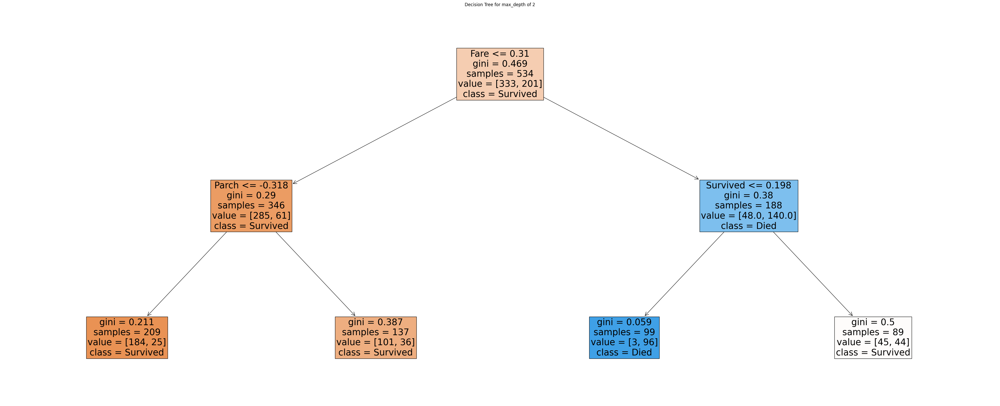

Training Set Accuracy for max_depth of 2: 0.797752808988764
Training Set Classification Report for max_depth of 2:
              precision    recall  f1-score   support

           0       0.76      0.99      0.86       333
           1       0.97      0.48      0.64       201

    accuracy                           0.80       534
   macro avg       0.86      0.73      0.75       534
weighted avg       0.84      0.80      0.78       534

Development Set Accuracy for max_depth of 2: 0.7640449438202247
Development Set Classification Report for max_depth of 2:
              precision    recall  f1-score   support

           0       0.74      0.96      0.84       113
           1       0.87      0.42      0.56        65

    accuracy                           0.76       178
   macro avg       0.81      0.69      0.70       178
weighted avg       0.79      0.76      0.74       178



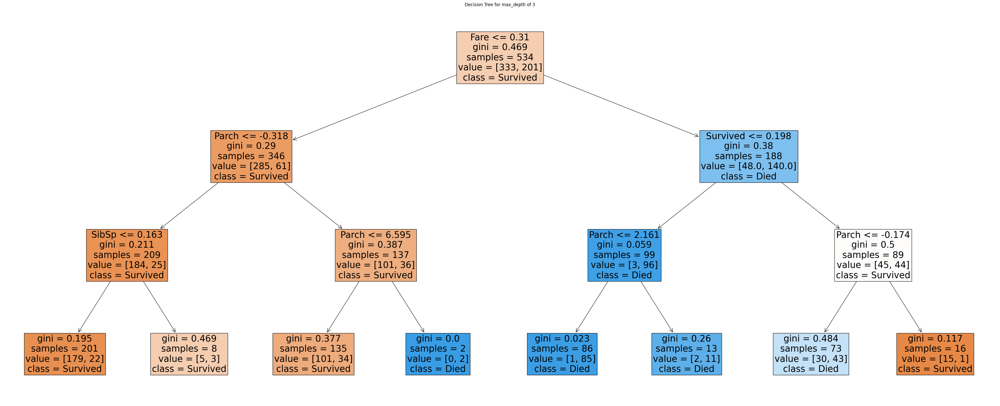

Training Set Accuracy for max_depth of 3: 0.8258426966292135
Training Set Classification Report for max_depth of 3:
              precision    recall  f1-score   support

           0       0.83      0.90      0.87       333
           1       0.81      0.70      0.75       201

    accuracy                           0.83       534
   macro avg       0.82      0.80      0.81       534
weighted avg       0.82      0.83      0.82       534

Development Set Accuracy for max_depth of 3: 0.7752808988764045
Development Set Classification Report for max_depth of 3:
              precision    recall  f1-score   support

           0       0.79      0.88      0.83       113
           1       0.74      0.60      0.66        65

    accuracy                           0.78       178
   macro avg       0.76      0.74      0.75       178
weighted avg       0.77      0.78      0.77       178



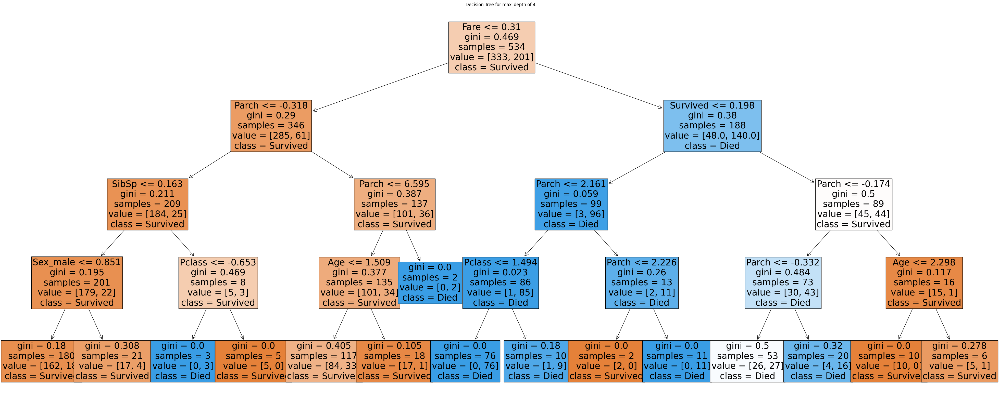

Training Set Accuracy for max_depth of 4: 0.8352059925093633
Training Set Classification Report for max_depth of 4:
              precision    recall  f1-score   support

           0       0.84      0.91      0.87       333
           1       0.82      0.72      0.77       201

    accuracy                           0.84       534
   macro avg       0.83      0.81      0.82       534
weighted avg       0.83      0.84      0.83       534

Development Set Accuracy for max_depth of 4: 0.7865168539325843
Development Set Classification Report for max_depth of 4:
              precision    recall  f1-score   support

           0       0.80      0.88      0.84       113
           1       0.75      0.63      0.68        65

    accuracy                           0.79       178
   macro avg       0.78      0.75      0.76       178
weighted avg       0.78      0.79      0.78       178



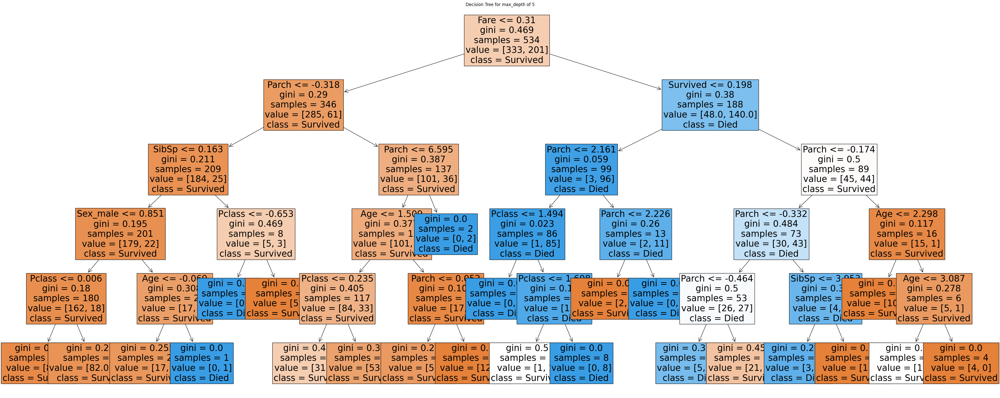

Training Set Accuracy for max_depth of 5: 0.8576779026217228
Training Set Classification Report for max_depth of 5:
              precision    recall  f1-score   support

           0       0.83      0.98      0.90       333
           1       0.94      0.66      0.78       201

    accuracy                           0.86       534
   macro avg       0.89      0.82      0.84       534
weighted avg       0.87      0.86      0.85       534

Development Set Accuracy for max_depth of 5: 0.7640449438202247
Development Set Classification Report for max_depth of 5:
              precision    recall  f1-score   support

           0       0.76      0.92      0.83       113
           1       0.78      0.49      0.60        65

    accuracy                           0.76       178
   macro avg       0.77      0.71      0.72       178
weighted avg       0.77      0.76      0.75       178



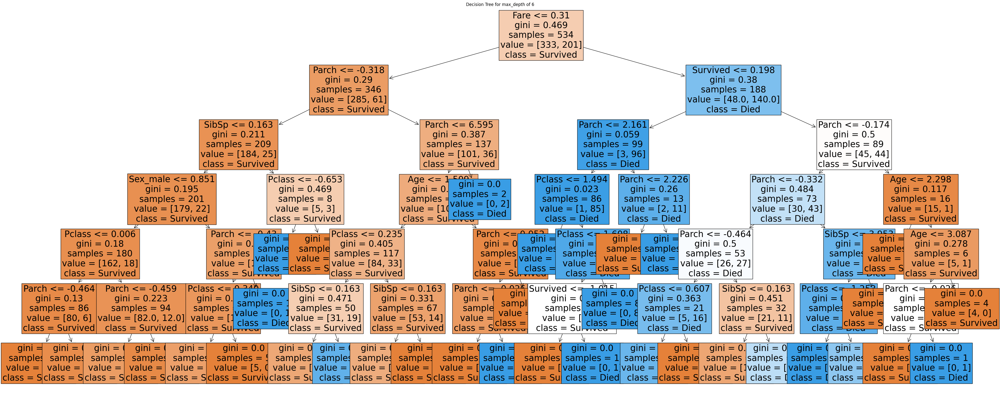

Training Set Accuracy for max_depth of 6: 0.8838951310861424
Training Set Classification Report for max_depth of 6:
              precision    recall  f1-score   support

           0       0.87      0.96      0.91       333
           1       0.92      0.76      0.83       201

    accuracy                           0.88       534
   macro avg       0.89      0.86      0.87       534
weighted avg       0.89      0.88      0.88       534

Development Set Accuracy for max_depth of 6: 0.7640449438202247
Development Set Classification Report for max_depth of 6:
              precision    recall  f1-score   support

           0       0.79      0.86      0.82       113
           1       0.71      0.60      0.65        65

    accuracy                           0.76       178
   macro avg       0.75      0.73      0.74       178
weighted avg       0.76      0.76      0.76       178



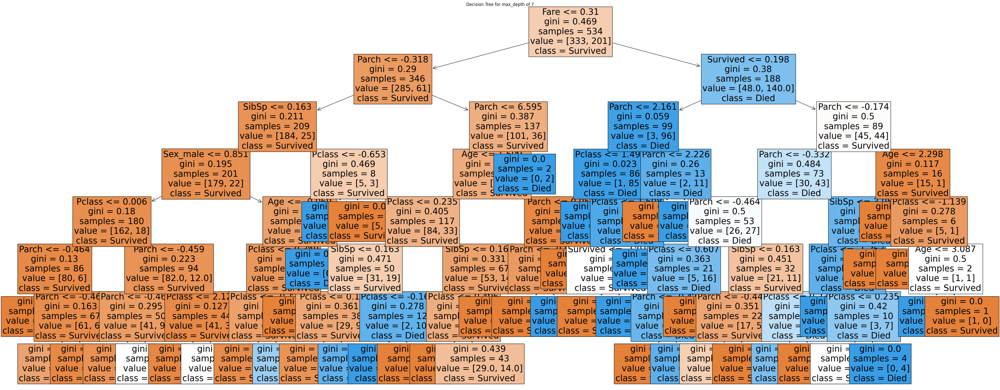

Training Set Accuracy for max_depth of 7: 0.9026217228464419
Training Set Classification Report for max_depth of 7:
              precision    recall  f1-score   support

           0       0.88      0.98      0.93       333
           1       0.96      0.78      0.86       201

    accuracy                           0.90       534
   macro avg       0.92      0.88      0.89       534
weighted avg       0.91      0.90      0.90       534

Development Set Accuracy for max_depth of 7: 0.7640449438202247
Development Set Classification Report for max_depth of 7:
              precision    recall  f1-score   support

           0       0.78      0.88      0.83       113
           1       0.73      0.55      0.63        65

    accuracy                           0.76       178
   macro avg       0.75      0.72      0.73       178
weighted avg       0.76      0.76      0.76       178



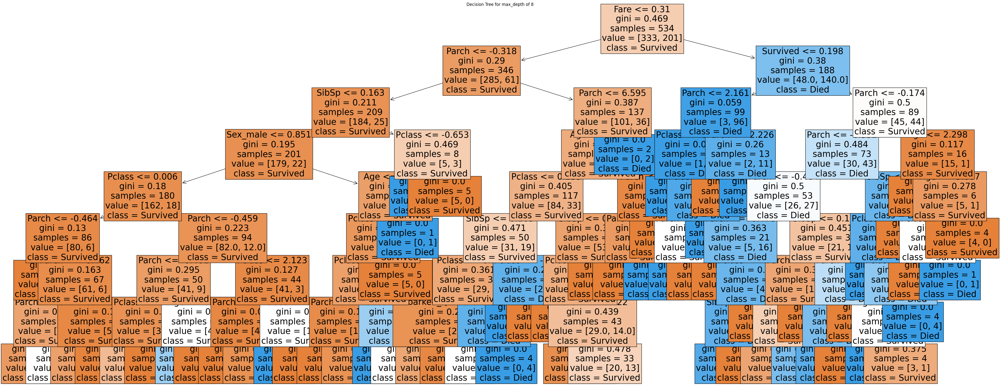

Training Set Accuracy for max_depth of 8: 0.9194756554307116
Training Set Classification Report for max_depth of 8:
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       333
           1       0.96      0.82      0.88       201

    accuracy                           0.92       534
   macro avg       0.93      0.90      0.91       534
weighted avg       0.92      0.92      0.92       534

Development Set Accuracy for max_depth of 8: 0.7528089887640449
Development Set Classification Report for max_depth of 8:
              precision    recall  f1-score   support

           0       0.77      0.87      0.82       113
           1       0.71      0.55      0.62        65

    accuracy                           0.75       178
   macro avg       0.74      0.71      0.72       178
weighted avg       0.75      0.75      0.75       178



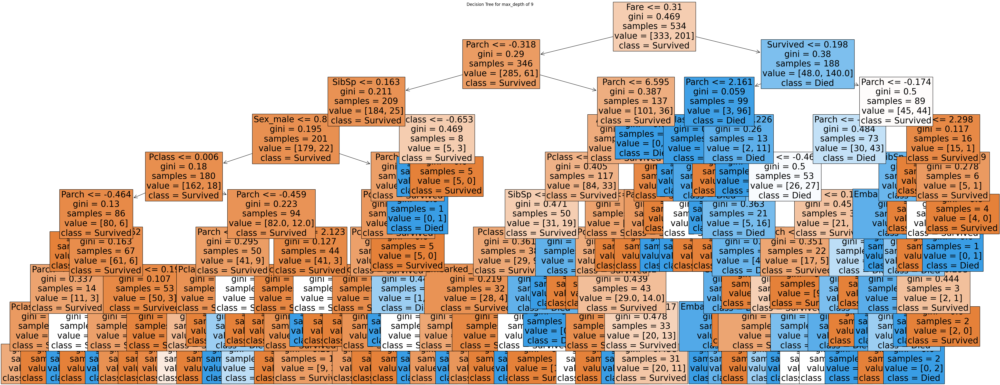

Training Set Accuracy for max_depth of 9: 0.9363295880149812
Training Set Classification Report for max_depth of 9:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95       333
           1       0.97      0.86      0.91       201

    accuracy                           0.94       534
   macro avg       0.95      0.92      0.93       534
weighted avg       0.94      0.94      0.94       534

Development Set Accuracy for max_depth of 9: 0.7752808988764045
Development Set Classification Report for max_depth of 9:
              precision    recall  f1-score   support

           0       0.80      0.87      0.83       113
           1       0.73      0.62      0.67        65

    accuracy                           0.78       178
   macro avg       0.76      0.74      0.75       178
weighted avg       0.77      0.78      0.77       178



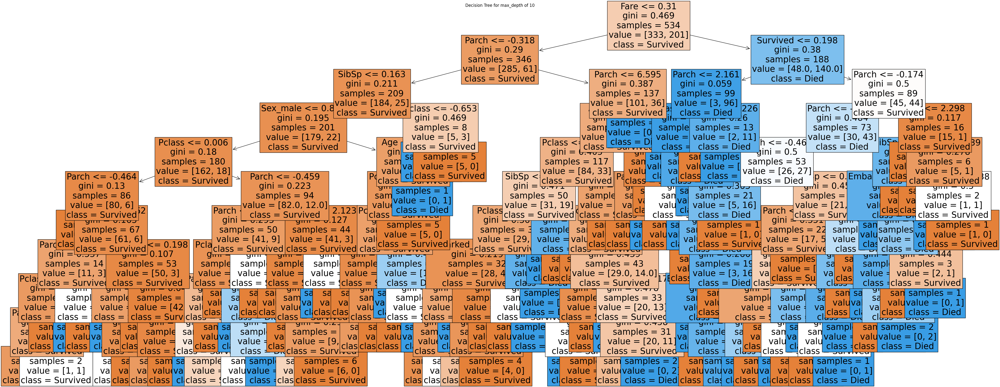

Training Set Accuracy for max_depth of 10: 0.951310861423221
Training Set Classification Report for max_depth of 10:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       333
           1       0.99      0.88      0.93       201

    accuracy                           0.95       534
   macro avg       0.96      0.94      0.95       534
weighted avg       0.95      0.95      0.95       534

Development Set Accuracy for max_depth of 10: 0.7640449438202247
Development Set Classification Report for max_depth of 10:
              precision    recall  f1-score   support

           0       0.79      0.85      0.82       113
           1       0.70      0.62      0.66        65

    accuracy                           0.76       178
   macro avg       0.75      0.73      0.74       178
weighted avg       0.76      0.76      0.76       178



In [365]:
# Train and evaluate the model with different values of max_depth
for d in range(2, 11):
    # Train a single Decision Tree model
    dt_model = DecisionTreeClassifier(max_depth=d, random_state=42)
    dt_model.fit(X_train_scaled, y_train)
    
    #Plot the model for each depth
    plt.figure(figsize=(50,20))
    features = titanic_clean_dt.columns
    classes = ['Survived','Died']
    tree.plot_tree(dt_model,feature_names=features,class_names=classes,filled=True,fontsize=25)
    plt.title(f'Decision Tree for max_depth of {d}')
    plt.show()
    
    
    # Predict on the Training set
    y_train_pred = dt_model.predict(X_train_scaled)
    y_dev_pred = dt_model.predict(X_dev_scaled)

    # Evaluate the model on the development set
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_report = classification_report(y_train, y_train_pred)

    dev_accuracy = accuracy_score(y_dev, y_dev_pred)
    dev_report = classification_report(y_dev, y_dev_pred)

    print(f"Training Set Accuracy for max_depth of {d}: {train_accuracy}")
    print(f"Training Set Classification Report for max_depth of {d}:")
    print(train_report)

    print(f"Development Set Accuracy for max_depth of {d}: {dev_accuracy}")
    print(f"Development Set Classification Report for max_depth of {d}:")
    print(dev_report)


### Pruned accuracy

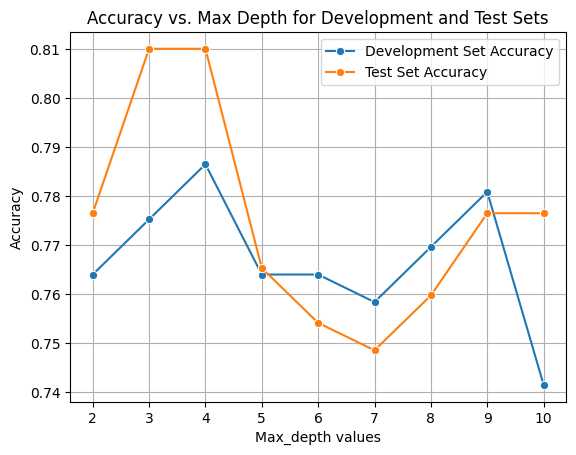

In [366]:
# looking at effect of max_depth pruning   
pruned_depths = range(2,11)


# Initialize lists to store accuracies
dev_scores = []
test_scores = []
 
for d in pruned_depths:
  clf = DecisionTreeClassifier(max_depth=d, random_state=1)
  clf.fit(X_train_scaled, y_train)
  dev_score = clf.score(X_dev_scaled, y_dev)
  test_score = clf.score(X_test_scaled, y_test)
  dev_scores.append(dev_score)
  test_scores.append(test_score)

sns.lineplot(x=pruned_depths, y=dev_scores, marker="o", label='Development Set Accuracy')
sns.lineplot(x=pruned_depths, y=test_scores, marker="o", label='Test Set Accuracy')
plt.xlabel("Max_depth values")
plt.ylabel("Accuracy")
plt.title("Accuracy vs. Max Depth for Development and Test Sets")
plt.legend()
plt.grid(True)
plt.show()


The highest accuracy for the both sets are for max_depth value of 4

### Pruned model results

In [367]:
# Train the final model with the best max_depth
best_max_depth = 4
final_model = DecisionTreeClassifier(max_depth=best_max_depth, random_state=1)
final_model.fit(X_train_scaled, y_train)

# Evaluate the final model on the test set
y_test_pred = final_model.predict(X_test_scaled)
final_test_accuracy = accuracy_score(y_test, y_test_pred)
final_test_report = classification_report(y_test, y_test_pred)

print(f"Final Model Test Set Accuracy: {final_test_accuracy}")
print("Final Model Test Set Classification Report:")
print(final_test_report)

Final Model Test Set Accuracy: 0.8100558659217877
Final Model Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.90      0.85       103
           1       0.84      0.68      0.75        76

    accuracy                           0.81       179
   macro avg       0.82      0.79      0.80       179
weighted avg       0.81      0.81      0.81       179

